In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from PIL import Image
from torch.utils.data.sampler import WeightedRandomSampler
from torchvision.datasets import DatasetFolder
import torchvision
from tqdm.notebook import tqdm as tqdm
from torchsampler import ImbalancedDatasetSampler
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn.functional as F
import copy
import os
from torchsummary import summary
from sklearn.metrics import f1_score

In [2]:
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('CUDA is not available.')
else:
    print('CUDA is available!')
device = "cuda" if train_on_gpu else "cpu"
# device = 'cpu'
RESUME = True

CUDA is available!


In [3]:
# supervised_path = "/home/max/Desktop/galaxy_science_display/eight_type/train/"
# val_image_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/validation/"
# test_image_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/test/"
unsupervised_path = "/home/max/Desktop/galaxy_science_display/images_gz2/"
iter1_supervised_path = "/home/max/Desktop/eight_type/train/"
# supervised_path = "/home/max/Desktop/galaxy_science_display/eight_type/train/"
supervised_path = "/home/max/Desktop/galaxy_science_display/galaxy_image/eight_type/train"
val_image_path = "/home/max/Desktop/galaxy_science_display/eight_type/validation/"
test_image_path = "/home/max/Desktop/galaxy_science_display/eight_type/test/"


batch_size = 24
train_trans = transforms.Compose([
#                                   transforms.RandomHorizontalFlip(),
#                                   transforms.RandomRotation((-30, 30)),
#                                   transforms.Resize((256, 256)),
#                                   transforms.RandomCrop(size=(100, 100)),
                                  transforms.Resize((299, 299)),
#                                   transforms.CenterCrop(200),
#                                   transforms.Resize((256, 256)),
#                                   transforms.Resize((255, 255)),
#                                   transforms.GaussianBlur(7,3),
#                                   transforms.ColorJitter(contrast=0.8),
                                  transforms.ToTensor()])
train_data = ImageFolder(supervised_path, transform=train_trans)
train_loader = DataLoader(train_data, pin_memory=True, batch_size=batch_size, sampler=ImbalancedDatasetSampler(train_data))

val_trans = transforms.Compose([transforms.Resize((299, 299)),transforms.ToTensor()])
val_data = ImageFolder(val_image_path, transform = val_trans)
val_loader = DataLoader(val_data, shuffle = True)

test_trans = transforms.Compose([transforms.Resize((299, 299)),transforms.ToTensor()])
test_data = ImageFolder(test_image_path, transform = test_trans)
test_loader = DataLoader(test_data, shuffle = True)

unsuper_trans = transforms.Compose([
#                                   transforms.RandomHorizontalFlip(),
#                                   transforms.RandomRotation((-30, 30)),
                                  transforms.Resize((299, 299)),
#                                   transforms.RandomCrop(size=(200, 200)),
#                                   transforms.Resize((256, 256)),
#                                   transforms.CenterCrop(200),
#                                   transforms.Resize((256, 256)),
#                                   transforms.GaussianBlur(7,3),
#                                   transforms.ColorJitter(contrast=0.8),
#                                   transforms.RandomResizedCrop((224, 224)),
                                  transforms.ToTensor()])
unsuper_data = ImageFolder(unsupervised_path, transform=unsuper_trans)
unsuper_loader = DataLoader(unsuper_data, pin_memory=True, batch_size=batch_size, shuffle=True)

tensor([0, 1, 0, 2, 2, 3, 6, 0, 1, 1, 0, 2, 4, 3, 2, 0, 4, 3, 2, 6, 2, 5, 6, 2])
tensor(0)


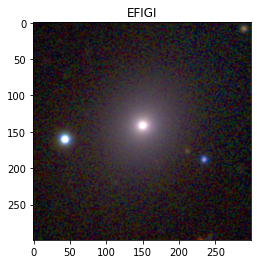

tensor(1)


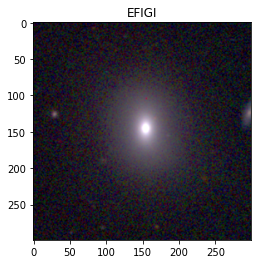

tensor(0)


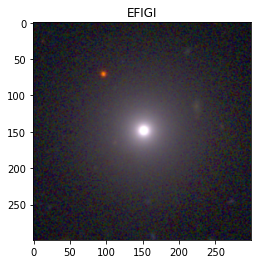

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
tensor(0)


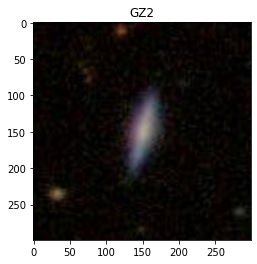

tensor(0)


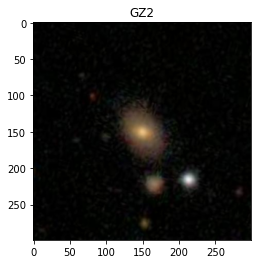

tensor(0)


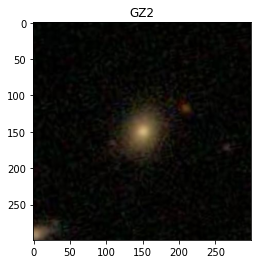

In [4]:
images, labels = next(iter(train_loader))
print(labels)
for i in np.arange(3):
    print(labels[i])
    plt.figure(i)
    plt.title('EFIGI')
    plt.imshow(images[i].permute(1, 2, 0))
    plt.show()
    
un_images, un_labels = next(iter(unsuper_loader))
print(un_labels)
for i in np.arange(3):
    print(un_labels[i])
    plt.figure(i)
    plt.title('GZ2')
    plt.imshow(un_images[i].permute(1, 2, 0))
    plt.show()

In [5]:
# model = torchvision.models.resnet18(pretrained=False)
model = torchvision.models.inception_v3(pretrained=False)
model = model.to(device)

/home/max/.local/lib/python3.8/site-packages/torchvision/models/inception.py:80: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn('The default weight initialization of inception_v3 will be changed in future releases of '


In [15]:
summary(torchvision.models.resnet18(pretrained=False).to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
       BasicBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

In [6]:
summary(model, (3, 299, 299))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

/home/max/.local/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [7]:
optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)
# optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, finetune_model.parameters()), lr=0.00001)
loss_func = nn.CrossEntropyLoss()

In [8]:
# # reg = JacobianReg() # Jacobian regularization
# lambda_JR = 0.01 # hyperparameter
# l1_crit = nn.L1Loss(size_average=False)
# factor = 0.03
n_epochs = 50
train_loss_record = []
train_acc_record = []
val_loss_record = []
val_acc_record = []
min_loss = 2000.
for epoch in range(n_epochs):
    train_loss = 0.0
    val_loss = 0.0
    train_acc = 0.0
    val_acc = 0.0
    model.train()
    for x, y in tqdm(train_loader):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        prediction = model(x)
#         print(prediction[0])
#         reg_loss = 0
#         reg_loss = l1_crit(prediction.argmax(dim = 1), y)
#         print(prediction)
        loss = loss_func(prediction[0], y)
        
#         loss = super_loss + factor*reg_loss
        
        loss.backward()
        optimizer.step()
        
        acc = ((prediction[0].argmax(dim = 1) == y).float().mean())
        train_acc += acc/len(train_loader)
        train_loss += loss/len(train_loader)
    print(f"[ Train | {epoch+1}/{n_epochs} ] loss = {train_loss:.5f}, acc = {train_acc:.5f}")
    train_loss_record.append(train_loss.item())
    train_acc_record.append(train_acc.item())

    model.eval()
    for x, y in tqdm(val_loader):
        with torch.no_grad():
            x, y = x.to(device), y.to(device)
            prediction = model(x)
#             reg_loss = 0

#             reg_loss = l1_crit(prediction.argmax(dim = 1), y)
#             print(prediction)
            loss = loss_func(prediction, y)
            
#             loss = super_loss + factor*reg_loss

    #         loss.backward()
            acc = ((prediction.argmax(dim = 1) == y).float().mean())
            val_acc += acc/len(val_loader)
            val_loss += loss/len(val_loader)
    if val_loss < min_loss:
        min_loss = val_loss
        torch.save(model, "inception_v3.pkl")
        print("Model Saved")
#             torch.save(state, "./checkpoint/best_%s.pth" % (str(epoch)))
#             torch.save(finetune_model, 'E_I_S_new.pkl')
    print(f"[ Validation | {epoch+1}/{n_epochs} ] loss = {val_loss:.5f}, acc = {val_acc:.5f}")
    val_loss_record.append(val_loss.item())
    val_acc_record.append(val_acc.item())
# torch.save(model, 'E_I_Sc.pkl')

  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 1/50 ] loss = 3.47245, acc = 0.23045


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 1/50 ] loss = 3.20962, acc = 0.31034


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 2/50 ] loss = 2.36213, acc = 0.29578


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 2/50 ] loss = 2.60079, acc = 0.34483


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 3/50 ] loss = 2.10923, acc = 0.33436


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 3/50 ] loss = 2.10510, acc = 0.38621


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 4/50 ] loss = 1.82100, acc = 0.40947


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 4/50 ] loss = 1.71299, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 5/50 ] loss = 1.70796, acc = 0.41924


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 5/50 ] loss = 1.55811, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 6/50 ] loss = 1.56803, acc = 0.45062


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 6/50 ] loss = 3.02762, acc = 0.31724


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 7/50 ] loss = 1.45963, acc = 0.49486


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 7/50 ] loss = 1.76492, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 8/50 ] loss = 1.40141, acc = 0.49846


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 8/50 ] loss = 1.64601, acc = 0.38621


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 9/50 ] loss = 1.31003, acc = 0.53704


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 9/50 ] loss = 1.57058, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 10/50 ] loss = 1.16449, acc = 0.58642


  0%|          | 0/145 [00:00<?, ?it/s]

Model Saved
[ Validation | 10/50 ] loss = 1.44504, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 11/50 ] loss = 1.13648, acc = 0.60391


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 11/50 ] loss = 1.79906, acc = 0.40000


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 12/50 ] loss = 1.09294, acc = 0.61626


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 12/50 ] loss = 2.06004, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 13/50 ] loss = 1.08064, acc = 0.63632


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 13/50 ] loss = 1.44550, acc = 0.51035


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 14/50 ] loss = 1.07309, acc = 0.63477


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 14/50 ] loss = 1.72778, acc = 0.42759


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 15/50 ] loss = 0.91422, acc = 0.69856


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 15/50 ] loss = 2.12806, acc = 0.46897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 16/50 ] loss = 0.90501, acc = 0.68827


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 16/50 ] loss = 1.83776, acc = 0.42759


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 17/50 ] loss = 0.83490, acc = 0.71348


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 17/50 ] loss = 1.67255, acc = 0.53103


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 18/50 ] loss = 0.71573, acc = 0.73251


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 18/50 ] loss = 3.91793, acc = 0.43448


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 19/50 ] loss = 0.67983, acc = 0.76286


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 19/50 ] loss = 2.22779, acc = 0.41379


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 20/50 ] loss = 0.78918, acc = 0.73508


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 20/50 ] loss = 2.37822, acc = 0.39310


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 21/50 ] loss = 0.71526, acc = 0.76440


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 21/50 ] loss = 2.23539, acc = 0.40000


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 22/50 ] loss = 0.73850, acc = 0.75566


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 22/50 ] loss = 1.88986, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 23/50 ] loss = 0.58321, acc = 0.79887


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 23/50 ] loss = 2.02187, acc = 0.48276


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 24/50 ] loss = 0.52046, acc = 0.81481


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 24/50 ] loss = 2.00597, acc = 0.48966


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 25/50 ] loss = 0.53287, acc = 0.81944


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 25/50 ] loss = 2.64539, acc = 0.37931


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 26/50 ] loss = 0.65956, acc = 0.78704


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 26/50 ] loss = 1.79198, acc = 0.56552


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 27/50 ] loss = 0.53993, acc = 0.81790


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 27/50 ] loss = 2.11399, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 28/50 ] loss = 0.48843, acc = 0.83642


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 28/50 ] loss = 2.10787, acc = 0.48966


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 29/50 ] loss = 0.49089, acc = 0.83230


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 29/50 ] loss = 2.11267, acc = 0.46207


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 30/50 ] loss = 0.50252, acc = 0.83385


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 30/50 ] loss = 1.75244, acc = 0.54483


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 31/50 ] loss = 0.40564, acc = 0.85545


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 31/50 ] loss = 2.43981, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 32/50 ] loss = 0.56871, acc = 0.81430


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 32/50 ] loss = 2.46045, acc = 0.50345


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 33/50 ] loss = 0.34914, acc = 0.87654


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 33/50 ] loss = 2.25045, acc = 0.49655


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 34/50 ] loss = 0.45529, acc = 0.84465


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 34/50 ] loss = 2.76018, acc = 0.40690


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 35/50 ] loss = 0.41649, acc = 0.86471


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 35/50 ] loss = 2.45121, acc = 0.45517


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 36/50 ] loss = 0.31064, acc = 0.88889


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 36/50 ] loss = 2.64868, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 37/50 ] loss = 0.25063, acc = 0.91152


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 37/50 ] loss = 2.60418, acc = 0.50345


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 38/50 ] loss = 0.26307, acc = 0.90792


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 38/50 ] loss = 3.14075, acc = 0.50345


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 39/50 ] loss = 0.46581, acc = 0.85288


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 39/50 ] loss = 2.08950, acc = 0.49655


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 40/50 ] loss = 0.34144, acc = 0.88477


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 40/50 ] loss = 2.25920, acc = 0.46897


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 41/50 ] loss = 0.25858, acc = 0.91358


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 41/50 ] loss = 3.16891, acc = 0.47586


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 42/50 ] loss = 0.19601, acc = 0.93210


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 42/50 ] loss = 3.51031, acc = 0.42069


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 43/50 ] loss = 0.19994, acc = 0.92233


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 43/50 ] loss = 3.26734, acc = 0.48966


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 44/50 ] loss = 0.31822, acc = 0.89095


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 44/50 ] loss = 2.69338, acc = 0.54483


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 45/50 ] loss = 0.34602, acc = 0.88272


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 45/50 ] loss = 2.48441, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 46/50 ] loss = 0.39265, acc = 0.86986


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 46/50 ] loss = 2.31990, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 47/50 ] loss = 0.23237, acc = 0.92284


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 47/50 ] loss = 2.95041, acc = 0.51724


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 48/50 ] loss = 0.34953, acc = 0.89300


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 48/50 ] loss = 2.51429, acc = 0.49655


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 49/50 ] loss = 0.39844, acc = 0.86780


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 49/50 ] loss = 2.20479, acc = 0.52414


  0%|          | 0/81 [00:00<?, ?it/s]

[ Train | 50/50 ] loss = 0.30559, acc = 0.90381


  0%|          | 0/145 [00:00<?, ?it/s]

[ Validation | 50/50 ] loss = 2.45052, acc = 0.46207


In [9]:
# finetune_model = torch.load('/home/max/Desktop/galaxy_final/finetune_model_new_version_iter1.pkl')
# finetune_model = torch.load('E_I_S_new_1227.pkl')
actu = []
ai_pred = []
model.eval()
test_acc = 0.0
test_loss = 0.0
for x, y in tqdm(test_loader):
    with torch.no_grad():
        x, y = x.to(device), y.to(device)
        prediction = model(x)
        actu.append(y.to('cpu').numpy()[0])
        ai_pred.append(prediction.argmax().to('cpu').numpy().tolist())
        loss = loss_func(prediction, y)
    #     loss.backward()
        acc = ((prediction.argmax(dim = 1) == y).float().mean())
        test_acc += acc/len(test_loader)
        test_loss += loss/len(test_loader)
print(f"[ Test ] loss = {test_loss:.5f}, acc = {test_acc:.5f}")

  0%|          | 0/145 [00:00<?, ?it/s]

[ Test ] loss = 3.31394, acc = 0.33793


tensor([0.9052], device='cuda:0', grad_fn=<IndexBackward>)
0.09051615595817566


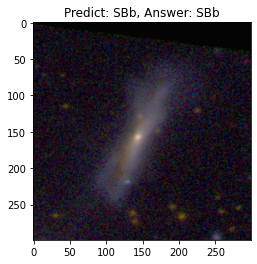

tensor([1.3573], device='cuda:0', grad_fn=<IndexBackward>)
0.13573484420776366


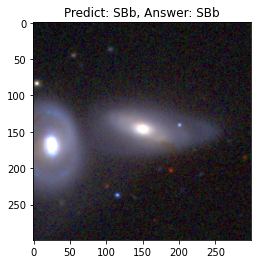

tensor([1.0008], device='cuda:0', grad_fn=<IndexBackward>)
0.10008230209350585


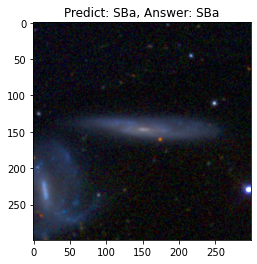

tensor([1.0168], device='cuda:0', grad_fn=<IndexBackward>)
0.10167585611343384


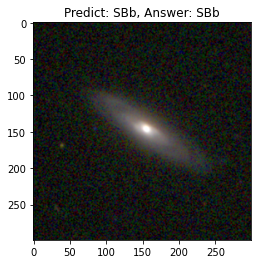

tensor([1.3299], device='cuda:0', grad_fn=<IndexBackward>)
0.13299037218093873


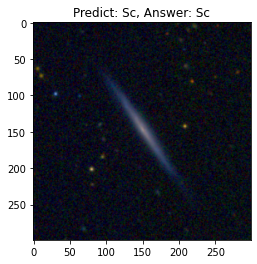

tensor([0.8800], device='cuda:0', grad_fn=<IndexBackward>)
0.08800487518310547


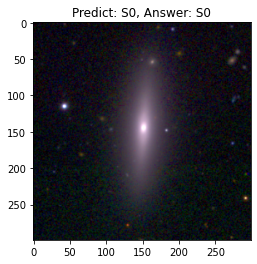

tensor([0.8815], device='cuda:0', grad_fn=<IndexBackward>)
0.08814528584480286


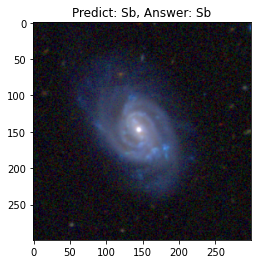

tensor([1.1952], device='cuda:0', grad_fn=<IndexBackward>)
0.11951694488525391


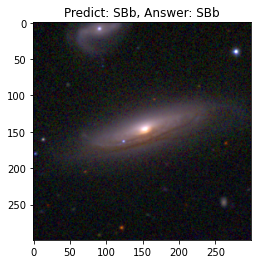

tensor([0.8768], device='cuda:0', grad_fn=<IndexBackward>)
0.08767566084861755


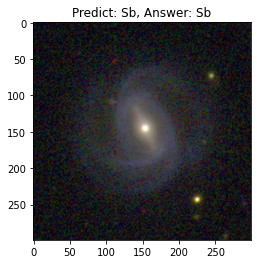

tensor([0.7867], device='cuda:0', grad_fn=<IndexBackward>)
0.07866591215133667


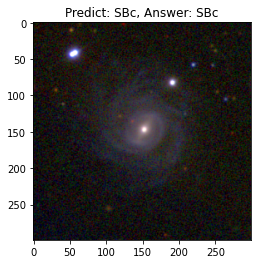

tensor([1.6271], device='cuda:0', grad_fn=<IndexBackward>)
0.16270668506622316


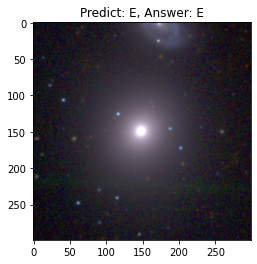

tensor([0.9906], device='cuda:0', grad_fn=<IndexBackward>)
0.09906029105186462


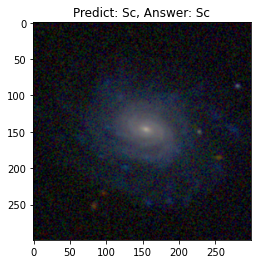

tensor([0.8876], device='cuda:0', grad_fn=<IndexBackward>)
0.08875851035118103


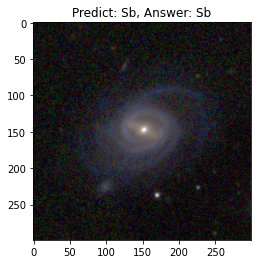

tensor([0.9734], device='cuda:0', grad_fn=<IndexBackward>)
0.09734411239624023


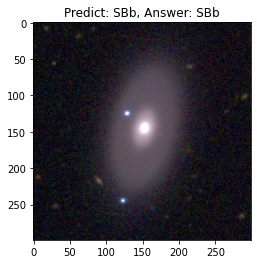

tensor([1.2825], device='cuda:0', grad_fn=<IndexBackward>)
0.12825019359588624


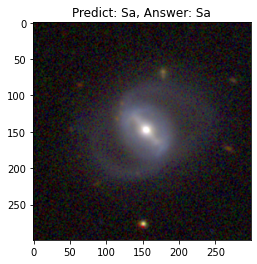

tensor([1.6273], device='cuda:0', grad_fn=<IndexBackward>)
0.16273049116134644


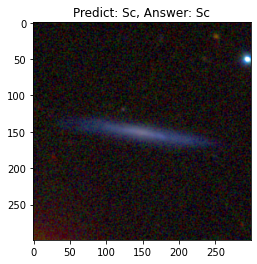

tensor([1.1177], device='cuda:0', grad_fn=<IndexBackward>)
0.11177338361740112


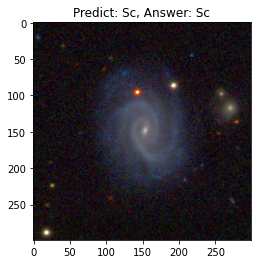

tensor([1.3786], device='cuda:0', grad_fn=<IndexBackward>)
0.13785640001296998


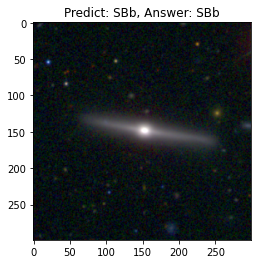

tensor([1.5550], device='cuda:0', grad_fn=<IndexBackward>)
0.15550040006637572


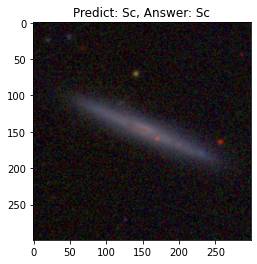

tensor([1.5621], device='cuda:0', grad_fn=<IndexBackward>)
0.15620629787445067


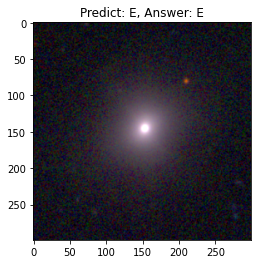

tensor([0.9431], device='cuda:0', grad_fn=<IndexBackward>)
0.09431104063987732


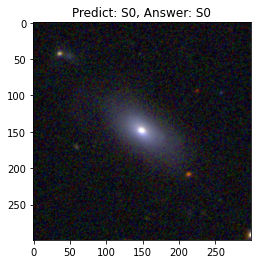

tensor([2.9084], device='cuda:0', grad_fn=<IndexBackward>)
0.29083566665649413


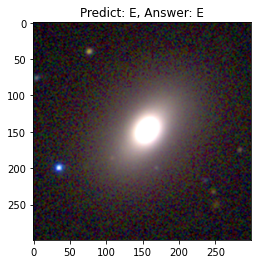

tensor([1.3001], device='cuda:0', grad_fn=<IndexBackward>)
0.13001211881637573


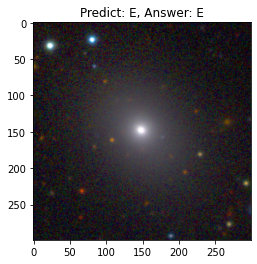

tensor([1.0715], device='cuda:0', grad_fn=<IndexBackward>)
0.10715069770812988


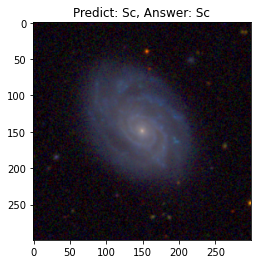

tensor([1.4537], device='cuda:0', grad_fn=<IndexBackward>)
0.1453699827194214


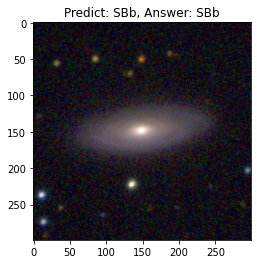

tensor([0.8222], device='cuda:0', grad_fn=<IndexBackward>)
0.08221747279167176


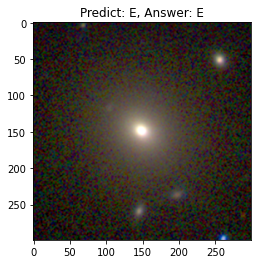

tensor([1.1055], device='cuda:0', grad_fn=<IndexBackward>)
0.11055240631103516


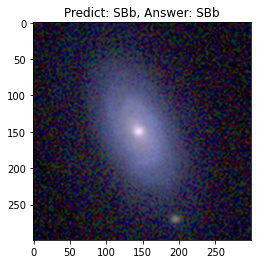

tensor([0.9149], device='cuda:0', grad_fn=<IndexBackward>)
0.09148839116096497


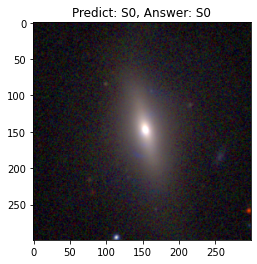

tensor([1.0515], device='cuda:0', grad_fn=<IndexBackward>)
0.10514992475509644


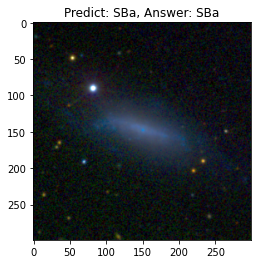

tensor([0.9498], device='cuda:0', grad_fn=<IndexBackward>)
0.09497600793838501


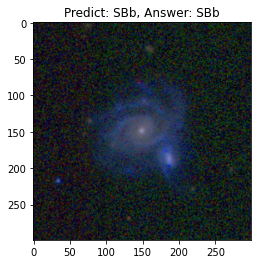

tensor([0.9746], device='cuda:0', grad_fn=<IndexBackward>)
0.0974604606628418


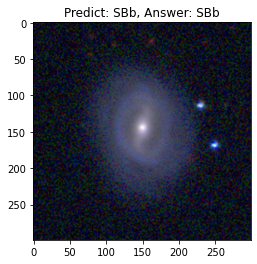

tensor([1.0870], device='cuda:0', grad_fn=<IndexBackward>)
0.1087022066116333


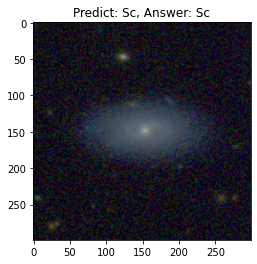

tensor([1.3744], device='cuda:0', grad_fn=<IndexBackward>)
0.13743675947189332


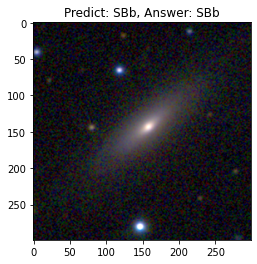

tensor([0.8289], device='cuda:0', grad_fn=<IndexBackward>)
0.0828940212726593


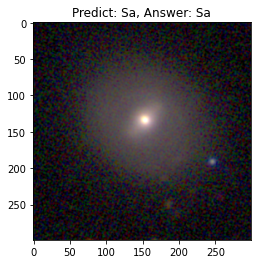

tensor([1.5933], device='cuda:0', grad_fn=<IndexBackward>)
0.15932745933532716


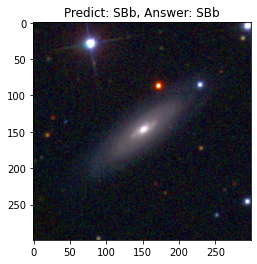

tensor([1.6533], device='cuda:0', grad_fn=<IndexBackward>)
0.1653323531150818


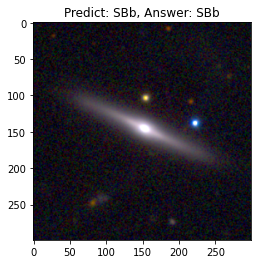

tensor([1.4225], device='cuda:0', grad_fn=<IndexBackward>)
0.14224796295166015


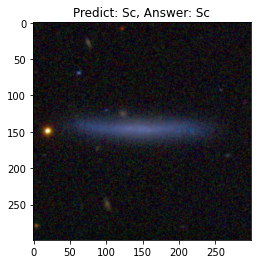

tensor([1.0517], device='cuda:0', grad_fn=<IndexBackward>)
0.10517162084579468


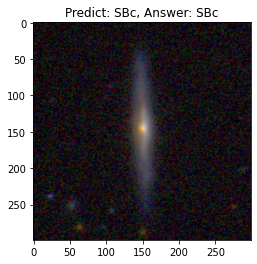

tensor([1.9755], device='cuda:0', grad_fn=<IndexBackward>)
0.19755384922027588


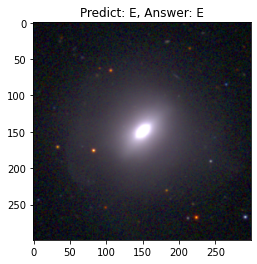

tensor([1.2614], device='cuda:0', grad_fn=<IndexBackward>)
0.12613729238510132


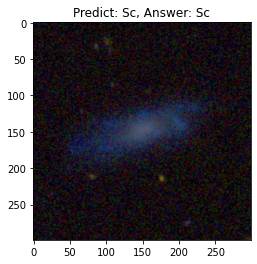

tensor([0.7848], device='cuda:0', grad_fn=<IndexBackward>)
0.0784791886806488


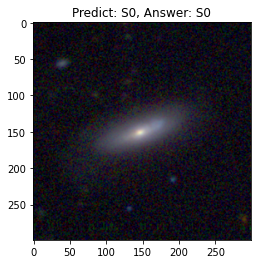

tensor([2.3922], device='cuda:0', grad_fn=<IndexBackward>)
0.23921546936035157


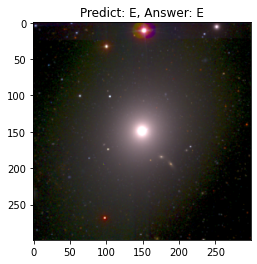

tensor([0.8375], device='cuda:0', grad_fn=<IndexBackward>)
0.08374968767166138


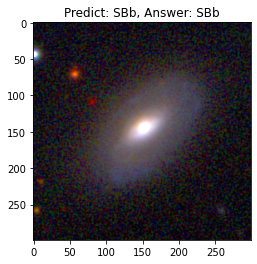

tensor([1.1519], device='cuda:0', grad_fn=<IndexBackward>)
0.11518820524215698


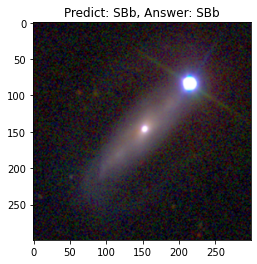

tensor([2.4696], device='cuda:0', grad_fn=<IndexBackward>)
0.24696221351623535


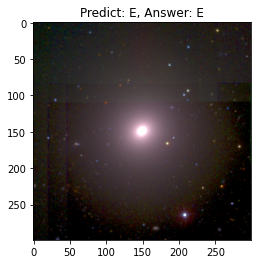

tensor([0.9455], device='cuda:0', grad_fn=<IndexBackward>)
0.09454798102378845


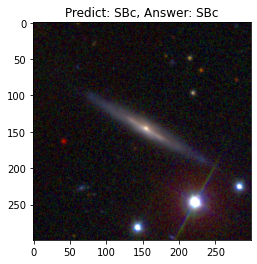

tensor([1.0001], device='cuda:0', grad_fn=<IndexBackward>)
0.10000761747360229


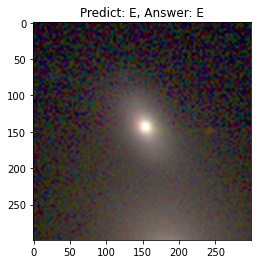

tensor([0.9203], device='cuda:0', grad_fn=<IndexBackward>)
0.09203214049339295


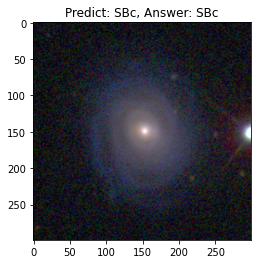

tensor([1.2805], device='cuda:0', grad_fn=<IndexBackward>)
0.12805243730545043


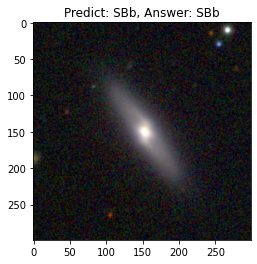

tensor([0.9367], device='cuda:0', grad_fn=<IndexBackward>)
0.09366959929466248


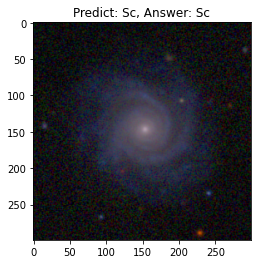

tensor([0.9854], device='cuda:0', grad_fn=<IndexBackward>)
0.09854170680046082


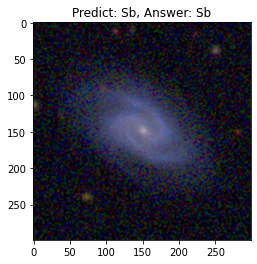

tensor([0.8653], device='cuda:0', grad_fn=<IndexBackward>)
0.08653120994567871


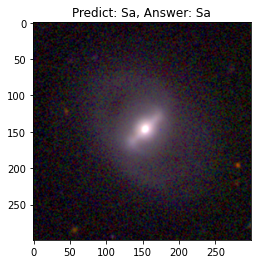

tensor([1.2143], device='cuda:0', grad_fn=<IndexBackward>)
0.12143335342407227


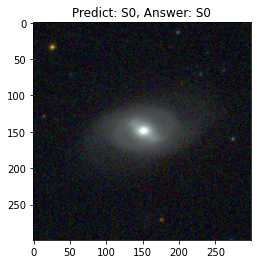

tensor([1.1269], device='cuda:0', grad_fn=<IndexBackward>)
0.11268506050109864


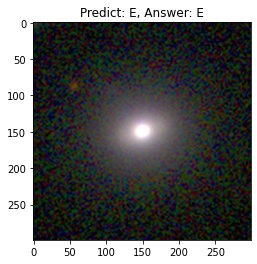

tensor([2.4321], device='cuda:0', grad_fn=<IndexBackward>)
0.2432053804397583


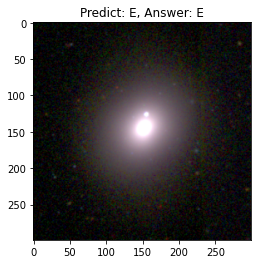

tensor([1.3579], device='cuda:0', grad_fn=<IndexBackward>)
0.13578513860702515


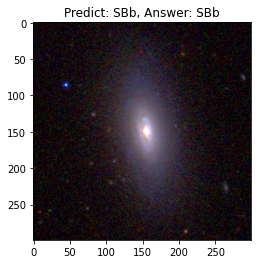

tensor([2.5195], device='cuda:0', grad_fn=<IndexBackward>)
0.2519469022750854


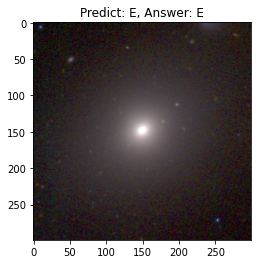

tensor([1.7569], device='cuda:0', grad_fn=<IndexBackward>)
0.1756921648979187


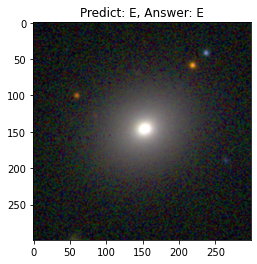

tensor([1.0637], device='cuda:0', grad_fn=<IndexBackward>)
0.10637222528457642


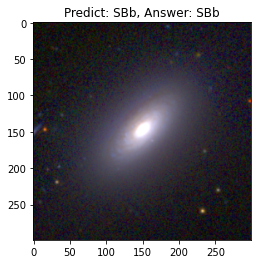

tensor([0.9838], device='cuda:0', grad_fn=<IndexBackward>)
0.09837509393692016


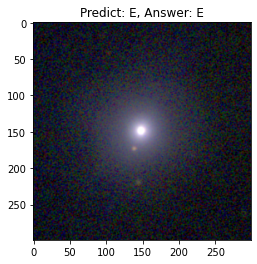

tensor([1.6745], device='cuda:0', grad_fn=<IndexBackward>)
0.16745455265045167


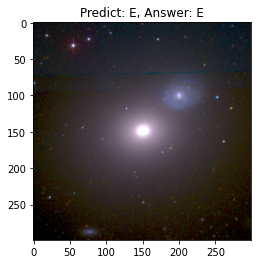

tensor([1.3416], device='cuda:0', grad_fn=<IndexBackward>)
0.13416320085525513


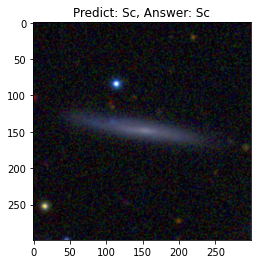

tensor([0.9057], device='cuda:0', grad_fn=<IndexBackward>)
0.09057213664054871


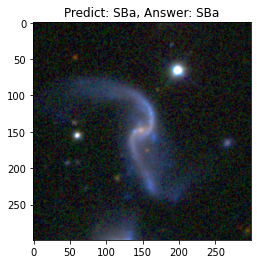

tensor([1.0355], device='cuda:0', grad_fn=<IndexBackward>)
0.10354920625686645


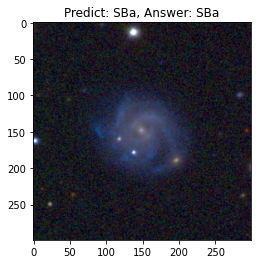

tensor([0.6927], device='cuda:0', grad_fn=<IndexBackward>)
0.0692653477191925


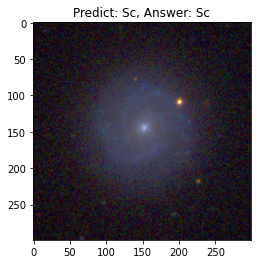

tensor([0.8889], device='cuda:0', grad_fn=<IndexBackward>)
0.08889027833938598


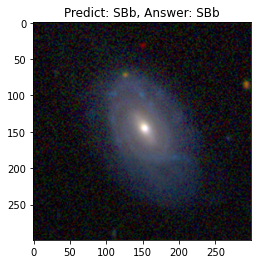

tensor([1.5298], device='cuda:0', grad_fn=<IndexBackward>)
0.15297518968582152


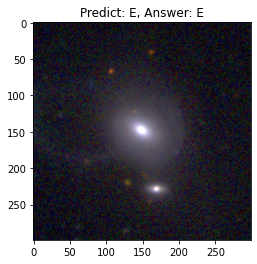

In [16]:
# model = torch.load('/home/max/Desktop/galaxy_final/finetune_model_new_version_iter1.pkl')
galaxy_type = ['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc']
loss_func = nn.CrossEntropyLoss()
i = 0
data = []
_all = []
for x, y in val_loader:
    i += 1
    if train_on_gpu:
        x, y = x.cuda(), y.cuda()
    output = model(x)/10
#     print(output)
#     break
    out = output.argmax(dim = 1)
#     out = out.to('cpu').numpy()
    ans = galaxy_type[y[0]]
    pre = galaxy_type[out[0]]
    if ans == pre:
        print(output[0][out])
    if output[0][out] > 0.3 and ans == pre:
        data.append(output[0][out].item())
        print(output[0][out].item()/10)
        plt.figure(i)
        plt.title(f'Predict: {pre}, Answer: {ans}')
#         if out[0] == 0:

#         elif out[0] == 1:
#             plt.title(f'Predict: {pre}, Answer: {ans}')
#         else:
#             plt.title(f'Predict: S, Answer: {ans}')
        x = x.squeeze()
        x = x.to('cpu')
        plt.imshow(x.permute(1, 2, 0))
        plt.show()
    else:
        _all.append(output[0][out].item())
        
#     if i % 10 == 0:
        
#         plt.figure(i)
#         plt.title(f'Predict: {pre}, Answer: {ans}')
# #         if out[0] == 0:
            
# #         elif out[0] == 1:
# #             plt.title(f'Predict: {pre}, Answer: {ans}')
# #         else:
# #             plt.title(f'Predict: S, Answer: {ans}')
#         x = x.squeeze()
#         x = x.to('cpu')
# #         plt.imshow(x.permute(1, 2, 0))
# #         plt.show()

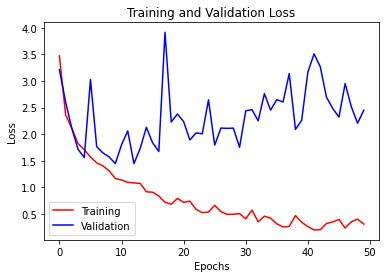

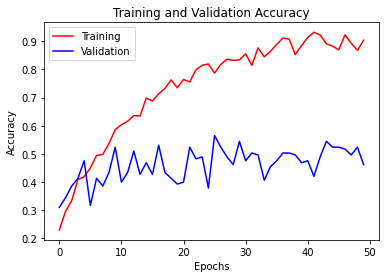

In [11]:
plt.figure(1)
plt.title('Training and Validation Loss')
train_l, = plt.plot(train_loss_record, color = 'red')
val_l, = plt.plot(val_loss_record, color = 'blue')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(handles = [train_l, val_l], labels = ['Training', 'Validation'], loc = 'best')
plt.show()

plt.figure(2)
plt.title('Training and Validation Accuracy')
train_a, = plt.plot(train_acc_record, color = 'red')
val_a, = plt.plot(val_acc_record, color = 'blue')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(handles = [train_a, val_a], labels = ['Training', 'Validation'], loc = 'best')
plt.show()

In [12]:
confmat = confusion_matrix(y_true=actu, y_pred=ai_pred)

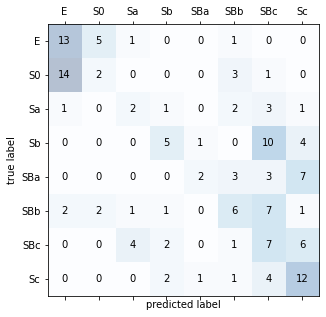

In [13]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(confmat, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confmat.shape[0]):
    for j in range(confmat.shape[1]):
        ax.text(x=j, y=i, s=confmat[i,j], va='center', ha='center')
plt.xlabel('predicted label')
plt.ylabel('true label')
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7],['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc'])
plt.yticks([0, 1, 2, 3, 4, 5, 6, 7],['E', 'S0', 'Sa', 'Sb', 'SBa', 'SBb', 'SBc', 'Sc'])
plt.show()

In [14]:
f1score = f1_score(actu, ai_pred, average='weighted')
print(f1score)

0.3171000747256775
